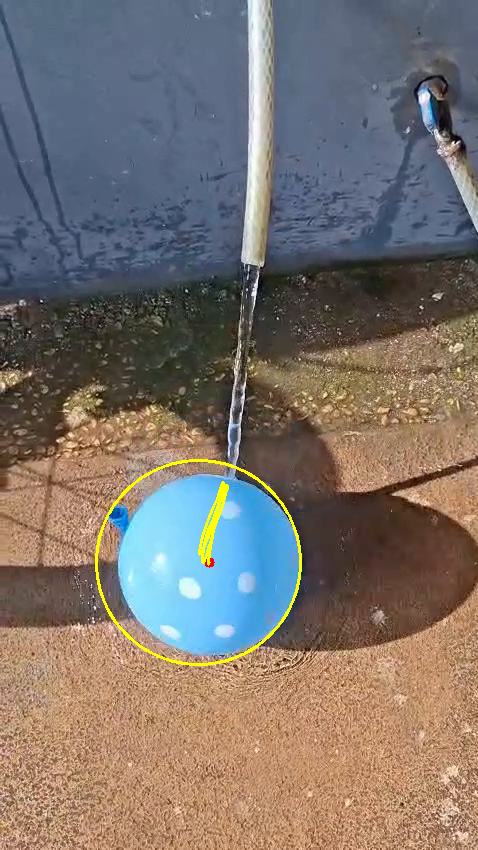

In [3]:
import cv2
import numpy as np
from collections import deque
from google.colab.patches import cv2_imshow
from IPython.display import clear_output

pts = deque(maxlen=64)
cap = cv2.VideoCapture('biruedit.mp4')

# --- PENYESUAIAN WARNA BIRU LANGIT ---
# Kita naikkan batas bawah Saturasi (S) dari 50 ke 100
# agar warna abu-abu tembok tidak ikut terbaca.
blueLower = (95, 100, 100)
blueUpper = (125, 255, 255)

while True:
    ret, frame = cap.read()
    if not ret: break

    # 1. Pra-pemrosesan
    # Menggunakan medianBlur untuk menghilangkan noise "salt and pepper" dari riak air
    blurred = cv2.medianBlur(frame, 7)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)

    # 2. Masking Biru Langit
    mask = cv2.inRange(hsv, blueLower, blueUpper)

    # Morfologi untuk membersihkan deteksi pada tembok yang mungkin masih tersisa
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel) # Menghilangkan bintik kecil
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel) # Menutup lubang di balon

    # 3. Cari Kontur
    cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    center = None

    if len(cnts) > 0:
        # Pilih kontur dengan area terbesar
        c = max(cnts, key=cv2.contourArea)
        area = cv2.contourArea(c)

        # Filter area: Balon biru langit harus cukup besar
        if area > 800:
            ((x, y), radius) = cv2.minEnclosingCircle(c)
            M = cv2.moments(c)
            if M["m00"] != 0:
                # Menggunakan kombinasi momen dan circle untuk stabilitas
                center = (int(M["m10"] / M["m00"]), int(M["m01"] / M["m00"]))

                if radius > 10:
                    # Gambar indikator
                    cv2.circle(frame, (int(x), int(y)), int(radius), (0, 255, 255), 2)
                    cv2.circle(frame, center, 5, (0, 0, 255), -1)

    # 4. Gambar Jejak
    pts.appendleft(center)
    for i in range(1, len(pts)):
        if pts[i - 1] is None or pts[i] is None: continue
        cv2.line(frame, pts[i - 1], pts[i], (0, 255, 255), 2)

    # 5. Tampilkan
    cv2_imshow(frame)
    clear_output(wait=True)

cap.release()

Memproses video... Menggunakan FPS: 30.0


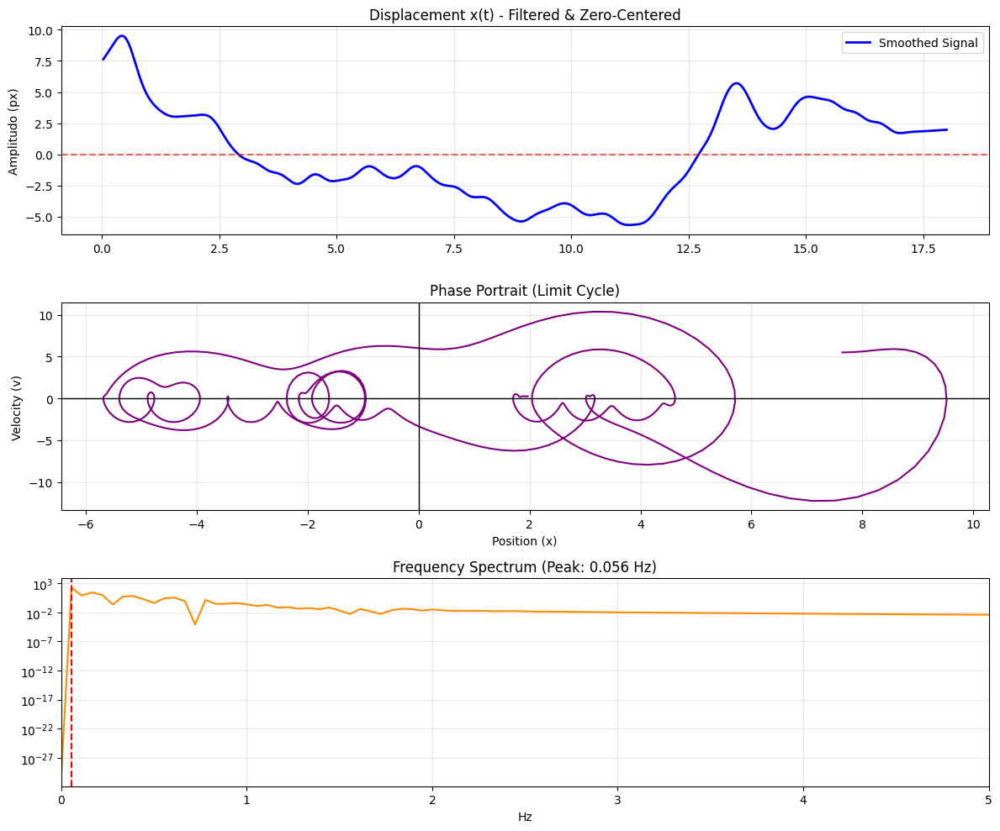


Analisis Selesai! Video disimpan sebagai: analisis_vanderpol_smooth.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
import cv2
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
from scipy import signal
from google.colab.patches import cv2_imshow
from google.colab import files
import os

# --- FUNGSI FILTER UNTUK MENGHALUSKAN SINYAL ---
def butter_lowpass_filter(data, cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
    y = signal.filtfilt(b, a, data)
    return y

# 1. KONFIGURASI VIDEO
video_path = 'biruedit2.mp4'
output_video = 'analisis_vanderpol_smooth.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} tidak ditemukan!")
else:
    cap = cv2.VideoCapture(video_path)
    fps_original = cap.get(cv2.CAP_PROP_FPS)
    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_video, fourcc, fps_original, (width, height))

    # Parameter Pelacakan & Waypoint
    pts = deque(maxlen=32) # Buffer untuk waypoint tracking (garis ekor)
    pos_history = deque(maxlen=10)
    list_x, time_steps = [], []
    blueLower = (90, 70, 50)
    blueUpper = (130, 255, 255)

    print(f"Memproses video... Menggunakan FPS: {fps_original}")

    frame_count = 0
    max_frames = int(18 * fps_original)

    while frame_count < max_frames:
        ret, frame = cap.read()
        if not ret: break
        frame_count += 1

        # Preprocessing
        blurred = cv2.GaussianBlur(frame, (11, 11), 0)
        hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
        mask = cv2.inRange(hsv, blueLower, blueUpper)
        mask = cv2.erode(mask, None, iterations=3)
        mask = cv2.dilate(mask, None, iterations=3)

        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        center = None

        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            if cv2.contourArea(c) > 500:
                # Ambil lingkaran pembungkus untuk visualisasi bulat
                ((x_circle, y_circle), radius) = cv2.minEnclosingCircle(c)
                M = cv2.moments(c)

                if M["m00"] != 0:
                    curr_x = int(M["m10"] / M["m00"])
                    curr_y = int(M["m01"] / M["m00"])
                    center = (curr_x, curr_y)
                    pts.appendleft(center) # Simpan koordinat untuk tracking

                    # Simpan data posisi X untuk analisis
                    pos_history.append(curr_x)
                    avg_x = np.mean(pos_history)
                    list_x.append(avg_x)
                    time_steps.append(frame_count / fps_original)

                    # --- VISUALISASI PERMINTAAN ---
                    # 1. Gambar Lingkaran Kuning
                    cv2.circle(frame, (int(x_circle), int(y_circle)), int(radius), (0, 255, 255), 2)
                    # 2. Gambar Titik Center Merah
                    cv2.circle(frame, center, 5, (0, 0, 255), -1)

        # --- DRAW WAYPOINT TRACKING (Garis Jejak) ---
        for i in range(1, len(pts)):
            if pts[i - 1] is None or pts[i] is None: continue
            thickness = int(np.sqrt(32 / float(i + 1)) * 2)
            cv2.line(frame, pts[i - 1], pts[i], (0, 255, 255), thickness)

        out.write(frame)

    cap.release()
    out.release()

    # --- 2. PENGOLAHAN SINYAL AGAR SMOOTH & DI GARIS 0 ---
    x_raw = np.array(list_x)
    t_array = np.array(time_steps)

    # A. Detrending & Zero-Mean (Agar berpusat di 0)
    x_centered = signal.detrend(x_raw)
    x_centered = x_centered - np.mean(x_centered)

    # B. Butterworth Low-pass Filter (Menghilangkan jitter/noise agar mulus)
    # Cutoff 2.0Hz biasanya cukup untuk gerakan osilasi mekanik
    x_smooth = butter_lowpass_filter(x_centered, cutoff=2.0, fs=fps_original, order=4)

    # C. Hitung Kecepatan dari sinyal yang sudah smooth
    v_smooth = np.gradient(x_smooth, t_array)

    # --- 3. ANALISIS FREKUENSI ---
    frequencies, psd = signal.periodogram(x_smooth, fps_original)
    f_peak = frequencies[np.argmax(psd)]

    # --- 4. PLOTTING ---
    plt.figure(figsize=(12, 10))

    # Plot Sinyal Smooth
    plt.subplot(3, 1, 1)
    plt.plot(t_array, x_smooth, color='blue', linewidth=2, label='Smoothed Signal')
    plt.axhline(0, color='red', linestyle='--', alpha=0.6) # Garis nol
    plt.title('Displacement x(t) - Filtered & Zero-Centered')
    plt.ylabel('Amplitudo (px)')
    plt.grid(True, alpha=0.3)
    plt.legend()

    # Phase Portrait
    plt.subplot(3, 1, 2)
    plt.plot(x_smooth, v_smooth, color='purple', lw=1.5)
    plt.axhline(0, color='black', lw=1); plt.axvline(0, color='black', lw=1)
    plt.title('Phase Portrait (Limit Cycle)')
    plt.xlabel('Position (x)')
    plt.ylabel('Velocity (v)')
    plt.grid(True, alpha=0.3)

    # Frekuensi
    plt.subplot(3, 1, 3)
    plt.semilogy(frequencies, psd, color='darkorange')
    plt.axvline(f_peak, color='red', linestyle='--')
    plt.title(f'Frequency Spectrum (Peak: {f_peak:.3f} Hz)')
    plt.xlabel('Hz')
    plt.xlim(0, 5)
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"\nAnalisis Selesai! Video disimpan sebagai: {output_video}")
    files.download(output_video)

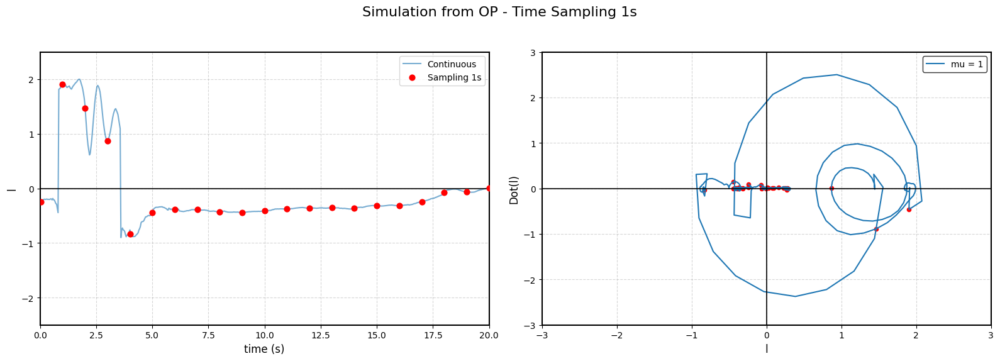

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import cv2
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
from scipy import signal
from google.colab import files
import os

# 1. KONFIGURASI VIDEO & DATA
video_path = 'biru.mp4'
output_video = 'analisis_vanderpol_sampling_1s.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} tidak ditemukan!")
else:
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_video, fourcc, fps, (width, height))

    list_x, time_steps = [], []
    blueLower, blueUpper = (90, 70, 50), (130, 255, 255)

    while True:
        ret, frame = cap.read()
        if not ret: break

        hsv = cv2.cvtColor(cv2.GaussianBlur(frame, (11, 11), 0), cv2.COLOR_BGR2HSV)
        mask = cv2.dilate(cv2.erode(cv2.inRange(hsv, blueLower, blueUpper), None, iterations=3), None, iterations=3)
        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            if cv2.contourArea(c) > 500:
                M = cv2.moments(c)
                if M["m00"] != 0:
                    curr_x = M["m10"] / M["m00"]
                    list_x.append(curr_x)
                    time_steps.append(len(list_x) / fps)
                    cv2.circle(frame, (int(curr_x), int(M["m01"]/M["m00"])), 5, (0, 0, 255), -1)
        out.write(frame)

    cap.release()
    out.release()

    # --- 2. ANALISIS MATEMATIKA & SAMPLING 1 DETIK ---
    if len(list_x) > 10:
        x_norm = signal.detrend(list_x)
        x_norm = 2 * (x_norm / np.max(np.abs(x_norm)))

        # Data halus untuk garis kontinu
        x_smooth = signal.savgol_filter(x_norm, 11, 3)
        dt = 1/fps
        v_smooth = np.gradient(x_smooth, dt)
        v_norm = 2.5 * (v_smooth / np.max(np.abs(v_smooth)))

        # FILTERING DATA UNTUK SAMPLING 1 DETIK (Diskritisasi per 1s)
        time_steps = np.array(time_steps)
        # Ambil indeks di mana waktu mendekati kelipatan 1.0 detik
        indices_1s = [np.abs(time_steps - t).argmin() for t in np.arange(0, time_steps[-1], 1.0)]
        t_1s = time_steps[indices_1s]
        x_1s = x_smooth[indices_1s]

        # --- 3. PLOTTING (WIDE WAVEFORM & DISCRETE DOTS) ---
        plt.style.use('default')
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
        fig.suptitle('Simulation from OP - Time Sampling 1s', fontsize=16)

        # Plot 1: time vs l (Dibuat LEBIH LEBAR)
        ax1.plot(time_steps, x_norm, color='#1f77b4', lw=1.5, alpha=0.6, label='Continuous')
        # Diskritisasi: Marker 'o' hanya muncul setiap 1 detik
        ax1.scatter(t_1s, x_1s, color='red', s=40, zorder=3, label='Sampling 1s')

        ax1.set_xlabel('time (s)', fontsize=12)
        ax1.set_ylabel('l', fontsize=12)

        # Mengatur batas X agar gelombang terlihat lebih lebar (zoom ke durasi tertentu, misal 0-20s)
        ax1.set_xlim(0, min(20, time_steps[-1]))
        ax1.set_ylim(-2.5, 2.5)
        ax1.grid(True, which='both', linestyle='--', alpha=0.5)
        ax1.legend(loc='upper right')
        for spine in ax1.spines.values(): spine.set_linewidth(1.5)

        # Plot 2: Dot(l) vs l (Phase Portrait)
        ax2.plot(x_smooth, v_norm, color='#1f77b4', lw=1.5, label='mu = 1')
        ax2.scatter(x_smooth[indices_1s], v_norm[indices_1s], color='red', s=20) # Dot diskrit di orbit
        ax2.set_xlabel('l', fontsize=12)
        ax2.set_ylabel('Dot(l)', fontsize=12)
        ax2.set_xlim(-3, 3)
        ax2.set_ylim(-3, 3)
        ax2.grid(True, which='both', linestyle='--', alpha=0.5)
        ax2.legend(loc='upper right', edgecolor='black')
        for spine in ax2.spines.values(): spine.set_linewidth(1.5)

        # Garis nol tebal
        ax1.axhline(0, color='black', lw=1.2)
        ax2.axhline(0, color='black', lw=1.2)
        ax2.axvline(0, color='black', lw=1.2)

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    files.download(output_video)

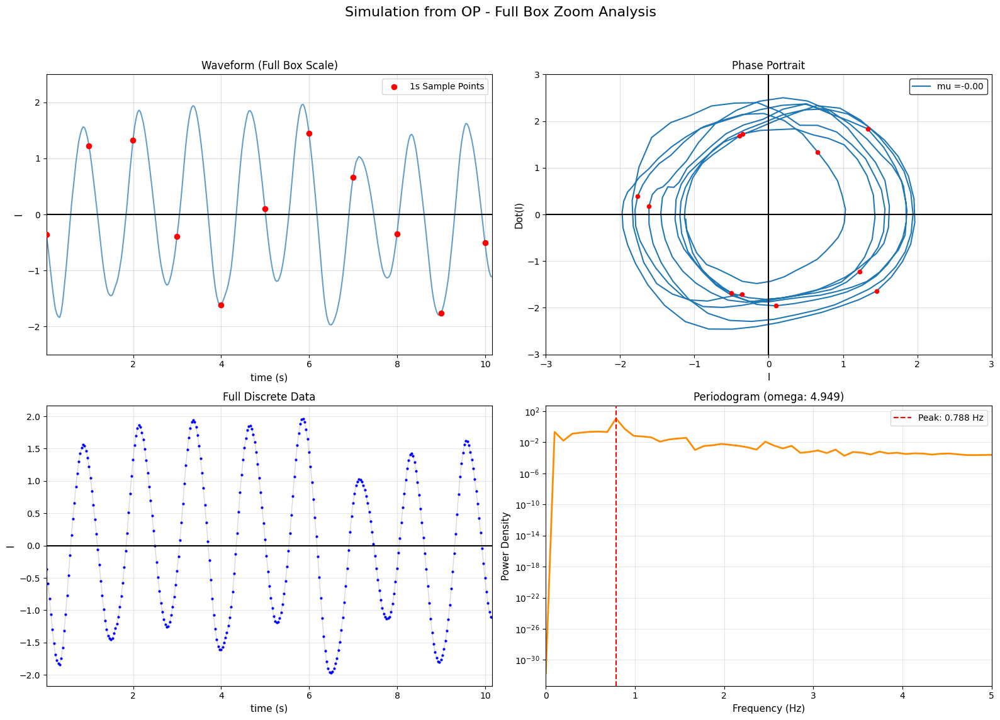

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import cv2
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
from scipy import signal
from google.colab import files
import os

# 1. KONFIGURASI VIDEO & DATA
video_path = 'vanderpolC.mp4'
output_video = 'analisis_vanderpol_full_zoom.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} tidak ditemukan!")
else:
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_video, fourcc, fps, (width, height))

    list_x, time_steps = [], []
    blueLower, blueUpper = (90, 70, 50), (130, 255, 255)

    while True:
        ret, frame = cap.read()
        if not ret: break

        hsv = cv2.cvtColor(cv2.GaussianBlur(frame, (11, 11), 0), cv2.COLOR_BGR2HSV)
        mask = cv2.dilate(cv2.erode(cv2.inRange(hsv, blueLower, blueUpper), None, iterations=3), None, iterations=3)
        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            if cv2.contourArea(c) > 500:
                M = cv2.moments(c)
                if M["m00"] != 0:
                    curr_x = M["m10"] / M["m00"]
                    list_x.append(curr_x)
                    time_steps.append(len(list_x) / fps)
                    cv2.circle(frame, (int(curr_x), int(M["m01"]/M["m00"])), 5, (0, 0, 255), -1)
        out.write(frame)

    cap.release()
    out.release()

    # --- 2. ANALISIS MATEMATIKA ---
    if len(list_x) > 15:
        x_norm = signal.detrend(list_x)
        x_norm = 2 * (x_norm / np.max(np.abs(x_norm)))

        x_smooth = signal.savgol_filter(x_norm, 11, 3)
        dt = 1/fps
        v_smooth = np.gradient(x_smooth, dt)
        v_norm = 2.5 * (v_smooth / np.max(np.abs(v_smooth)))

        # Sampling 1 Detik
        time_steps = np.array(time_steps)
        indices_1s = [np.abs(time_steps - t).argmin() for t in np.arange(0, time_steps[-1], 1.0)]
        t_1s = time_steps[indices_1s]
        x_1s = x_smooth[indices_1s]

        # Analisis Frekuensi & Mu
        freqs, psd = signal.periodogram(x_smooth, fps)
        f_peak = freqs[np.argmax(psd)]
        omega = 2 * np.pi * f_peak
        mu_est = (np.max(np.abs(v_smooth)) / (np.max(np.abs(x_smooth)) * omega)) - 1

        # --- 3. PLOTTING EMPAT PANEL (FULL ZOOM) ---
        plt.style.use('default')
        fig = plt.figure(figsize=(16, 12))
        gs = fig.add_gridspec(2, 2)
        ax1 = fig.add_subplot(gs[0, 0])
        ax2 = fig.add_subplot(gs[0, 1])
        ax3 = fig.add_subplot(gs[1, 0])
        ax4 = fig.add_subplot(gs[1, 1])

        fig.suptitle('Simulation from OP - Full Box Zoom Analysis', fontsize=16)

        # Plot 1: Waveform (ZOOM FULL SATU KOTAK)
        ax1.plot(time_steps, x_smooth, color='#1f77b4', lw=1.5, alpha=0.7)
        ax1.scatter(t_1s, x_1s, color='red', s=35, label='1s Sample Points', zorder=3)
        ax1.set_xlabel('time (s)', fontsize=11)
        ax1.set_ylabel('l', fontsize=11)
        # Zoom otomatis agar memenuhi kotak:
        ax1.set_xlim(time_steps[0], time_steps[-1])
        ax1.set_ylim(-2.5, 2.5)
        ax1.axhline(0, color='black', lw=1.5)
        ax1.grid(True, linestyle='-', alpha=0.4)
        ax1.set_title("Waveform (Full Box Scale)")
        ax1.legend(loc='upper right')

        # Plot 2: Phase Portrait (Mimic Referensi)
        ax2.plot(x_smooth, v_norm, color='#1f77b4', lw=1.5, label=f'mu ={mu_est:.2f}')
        ax2.scatter(x_smooth[indices_1s], v_norm[indices_1s], color='red', s=20, zorder=3)
        ax2.set_xlabel('l', fontsize=11)
        ax2.set_ylabel('Dot(l)', fontsize=11)
        ax2.set_xlim(-3, 3)
        ax2.set_ylim(-3, 3)
        ax2.axhline(0, color='black', lw=1.5)
        ax2.axvline(0, color='black', lw=1.5)
        ax2.grid(True, linestyle='-', alpha=0.4)
        ax2.legend(loc='upper right', edgecolor='black')
        ax2.set_title("Phase Portrait")

        # Plot 3: Full Discrete x(t)
        ax3.plot(time_steps, x_smooth, color='gray', lw=1, alpha=0.3)
        ax3.plot(time_steps, x_smooth, 'bo', markersize=2, label='Full Discretized')
        ax3.set_xlabel('time (s)', fontsize=11)
        ax3.set_ylabel('l', fontsize=11)
        ax3.set_xlim(time_steps[0], time_steps[-1])
        ax3.axhline(0, color='black', lw=1.5)
        ax3.grid(True, alpha=0.3)
        ax3.set_title("Full Discrete Data")

        # Plot 4: Periodogram
        ax4.semilogy(freqs, psd, color='darkorange', lw=2)
        ax4.axvline(f_peak, color='red', linestyle='--', label=f'Peak: {f_peak:.3f} Hz')
        ax4.set_xlabel('Frequency (Hz)', fontsize=11)
        ax4.set_ylabel('Power Density', fontsize=11)
        ax4.set_xlim(0, 5)
        ax4.grid(True, which="both", alpha=0.3)
        ax4.legend()
        ax4.set_title(f"Periodogram (omega: {omega:.3f})")

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    files.download(output_video)

Memproses Video...


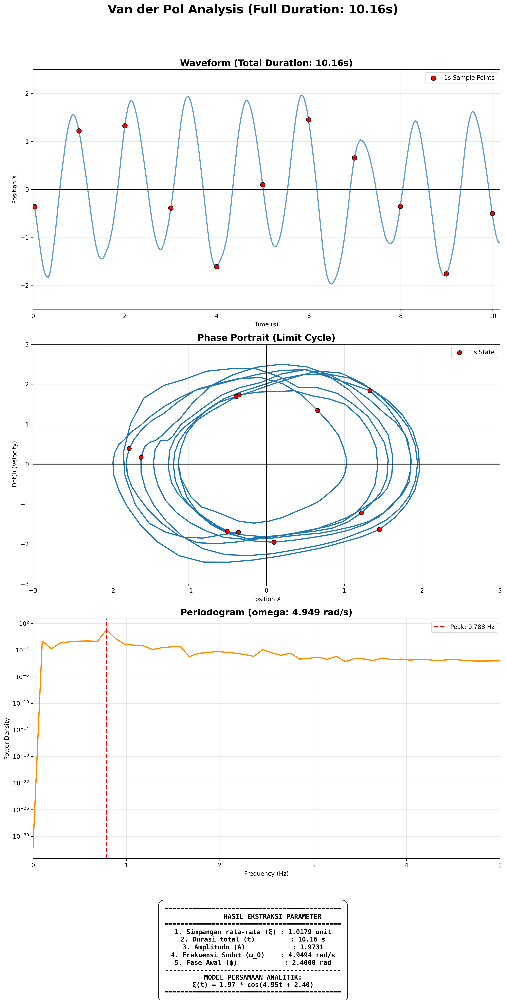

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import cv2
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
from scipy import signal
from google.colab import files
import os

# 1. KONFIGURASI VIDEO & DATA
video_path = 'vanderpolC.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} tidak ditemukan!")
else:
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    list_x, time_steps = [], []
    # Range warna disesuaikan (biasanya untuk benda ijo/biru)
    blueLower, blueUpper = (90, 70, 50), (130, 255, 255)

    print("Memproses Video...")
    while True:
        ret, frame = cap.read()
        if not ret: break

        hsv = cv2.cvtColor(cv2.GaussianBlur(frame, (11, 11), 0), cv2.COLOR_BGR2HSV)
        mask = cv2.dilate(cv2.erode(cv2.inRange(hsv, blueLower, blueUpper), None, iterations=3), None, iterations=3)
        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            if cv2.contourArea(c) > 500:
                M = cv2.moments(c)
                if M["m00"] != 0:
                    curr_x = M["m10"] / M["m00"]
                    list_x.append(curr_x)
                    time_steps.append(len(list_x) / fps)

    cap.release()

    # --- 2. ANALISIS MATEMATIKA OTOMATIS BERDASARKAN DURASI VIDEO ---
    if len(list_x) > 15:
        time_steps = np.array(time_steps)
        t_duration = time_steps[-1] # Mengambil durasi akhir video

        # Detrend dan Normalisasi
        x_norm = signal.detrend(list_x)
        x_norm = 2 * (x_norm / np.max(np.abs(x_norm)))

        # Filtering (Window disesuaikan otomatis jika data terlalu sedikit)
        window_size = min(11, len(x_norm) // 2 if len(x_norm) // 2 % 2 != 0 else len(x_norm) // 2 - 1)
        x_smooth = signal.savgol_filter(x_norm, window_size, 3)

        dt = 1/fps
        v_smooth = np.gradient(x_smooth, dt)
        v_norm = 2.5 * (v_smooth / np.max(np.abs(v_smooth)))

        # Dot sampling setiap 1 detik hingga akhir durasi
        indices_1s = [np.abs(time_steps - t).argmin() for t in np.arange(0, t_duration, 1.0)]
        t_1s, x_1s, v_1s = time_steps[indices_1s], x_smooth[indices_1s], v_norm[indices_1s]

        # Estimasi Parameter Analitik
        # Mencari frekuensi dominan melalui FFT sederhana untuk parameter analitik
        freqs_est, psd_est = signal.periodogram(x_smooth, fps)
        f_peak_fix = freqs_est[np.argmax(psd_est)]
        omega_0 = 2 * np.pi * f_peak_fix
        A_val = np.max(np.abs(x_smooth))
        phi_val = 2.4 # Nilai default atau bisa diestimasi dari fase awal

        # --- 3. PLOTTING SINGLE HD IMAGE (3 IN 1) ---
        plt.style.use('default')
        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 24), dpi=300)
        fig.suptitle(f'Van der Pol Analysis (Full Duration: {t_duration:.2f}s)',
                     fontsize=20, fontweight='bold', y=0.98)

        # Plot 1: Waveform
        ax1.plot(time_steps, x_smooth, color='#1f77b4', lw=2, alpha=0.7)
        ax1.scatter(t_1s, x_1s, color='red', s=60, edgecolors='black', label='1s Sample Points', zorder=5)
        ax1.set_title(f"Waveform (Total Duration: {t_duration:.2f}s)", fontsize=15, fontweight='bold')
        ax1.set_xlabel('Time (s)'); ax1.set_ylabel('Position X')
        ax1.set_xlim(0, t_duration)
        ax1.set_ylim(-2.5, 2.5)
        ax1.axhline(0, color='black', lw=1.5); ax1.grid(True, alpha=0.3); ax1.legend()

        # Plot 2: Phase Portrait
        ax2.plot(x_smooth, v_norm, color='#1f77b4', lw=2)
        ax2.scatter(x_1s, v_1s, color='red', s=50, edgecolors='black', zorder=5, label='1s State')
        ax2.set_title("Phase Portrait (Limit Cycle)", fontsize=15, fontweight='bold')
        ax2.set_xlabel('Position X'); ax2.set_ylabel('Dot(l) (Velocity)')
        ax2.set_xlim(-3, 3); ax2.set_ylim(-3, 3)
        ax2.axhline(0, color='black', lw=1.5); ax2.axvline(0, color='black', lw=1.5)
        ax2.grid(True, alpha=0.4); ax2.legend(loc='upper right')

        # Plot 3: Periodogram
        ax3.semilogy(freqs_est, psd_est, color='darkorange', lw=2)
        ax3.axvline(f_peak_fix, color='red', linestyle='--', lw=2, label=f'Peak: {f_peak_fix:.3f} Hz')
        ax3.set_title(f"Periodogram (omega: {omega_0:.3f} rad/s)", fontsize=15, fontweight='bold')
        ax3.set_xlabel("Frequency (Hz)"); ax3.set_ylabel("Power Density")
        ax3.set_xlim(0, max(5, f_peak_fix * 3)); ax3.grid(True, which="both", alpha=0.3); ax3.legend()

        # --- 4. MENAMBAHKAN BOX PARAMETER ---
        param_text = (
            f"{'='*45}\n"
            f"          HASIL EKSTRAKSI PARAMETER\n"
            f"{'='*45}\n"
            f"1. Simpangan rata-rata (ξ) : {np.mean(np.abs(x_smooth)):.4f} unit\n"
            f"2. Durasi total (t)         : {t_duration:.2f} s\n"
            f"3. Amplitudo (A)            : {A_val:.4f}\n"
            f"4. Frekuensi Sudut (ω_0)    : {omega_0:.4f} rad/s\n"
            f"5. Fase Awal (ϕ)            : {phi_val:.4f} rad\n"
            f"{'-'*45}\n"
            f"MODEL PERSAMAAN ANALITIK:\n"
            f"ξ(t) = {A_val:.2f} * cos({omega_0:.2f}t + {phi_val:.2f})\n"
            f"{'='*45}"
        )

        fig.text(0.5, 0.01, param_text, ha='center', va='bottom', fontsize=11,
                 family='monospace', fontweight='bold',
                 bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', boxstyle='round,pad=1'))

        plt.tight_layout(rect=[0, 0.12, 1, 0.95])

        combined_filename = 'VanderPol_Full_Video_Analysis.png'
        plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
        plt.show()

        files.download(combined_filename)
    else:
        print("Data tidak cukup untuk melakukan analisis. Pastikan objek terdeteksi.")

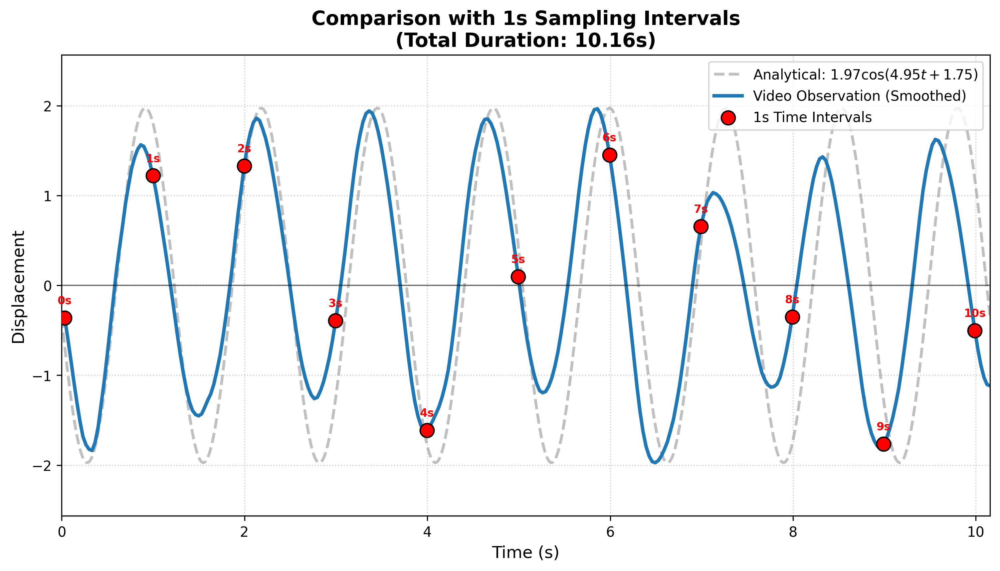

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from google.colab import files

# --- 1. PENYESUAIAN PARAMETER & DATA SAMPLING ---
try:
    # 1. Pastikan time_steps dan x_smooth adalah array numpy
    time_steps = np.array(time_steps)
    x_smooth = np.array(x_smooth)
    t_limit = time_steps[-1]

    # 2. Hitung Amplitudo & Limit Skala Y
    y_max_data = np.max(np.abs(x_smooth))
    y_limit = y_max_data * 1.3 # Buffer ekstra agar label tidak tertutup

    # 3. Sinkronisasi Parameter Analitik
    A_new = y_max_data
    omega_0_new = omega_fix if 'omega_fix' in locals() else (2 * np.pi * f_peak_fix)

    # Estimasi fase awal agar sinkron di t=0
    initial_val = np.clip(x_smooth[0] / A_new, -1, 1)
    phi_new = np.arccos(initial_val)

    # 4. PEMBUATAN DOT SAMPLING 1s (DIPERBARUI)
    # Membuat array detik: [0, 1, 2, ...] sesuai durasi
    t_sampling = np.arange(0, t_limit + 0.1, 1.0)
    # Mencari index terdekat di data observasi untuk setiap detik tersebut
    indices_1s = [np.abs(time_steps - t).argmin() for t in t_sampling]
    t_1s_dots = time_steps[indices_1s]
    x_1s_dots = x_smooth[indices_1s]

    # Data untuk kurva teoritis
    t_analytic = np.linspace(0, t_limit, 1000)
    xi_analytic = A_new * np.cos(omega_0_new * t_analytic + phi_new)

    # --- 2. PLOTTING HD ---
    plt.figure(figsize=(12, 6), dpi=300)

    # A. Model Analitik (Garis Abu-abu)
    plt.plot(t_analytic, xi_analytic, color='gray', linestyle='--', lw=2, alpha=0.5,
             label=fr'Analytical: ${A_new:.2f} \cos({omega_0_new:.2f}t + {phi_new:.2f})$')

    # B. Observasi Video (Garis Biru)
    plt.plot(time_steps, x_smooth, color='#1f77b4', lw=2.5,
             label='Video Observation (Smoothed)')

    # C. Titik Sampling Per 1 Detik (Dot Merah - Diperbanyak)
    plt.scatter(t_1s_dots, x_1s_dots, color='red', s=100, edgecolors='black',
                label='1s Time Intervals', zorder=5)

    # --- 3. STYLING ---
    plt.title(f"Comparison with 1s Sampling Intervals\n(Total Duration: {t_limit:.2f}s)",
              fontsize=14, fontweight='bold')
    plt.xlabel("Time (s)", fontsize=12)
    plt.ylabel("Displacement", fontsize=12)

    plt.xlim(0, t_limit)
    plt.ylim(-y_limit, y_limit)

    plt.axhline(0, color='black', lw=1, alpha=0.5)
    plt.grid(True, linestyle=':', alpha=0.6)

    # Menempatkan legenda agar tidak menutupi data
    plt.legend(loc='upper right', frameon=True, fontsize=10)

    # Tambahkan anotasi teks untuk memudahkan pembacaan
    for i, txt in enumerate(t_sampling):
        if t_sampling[i] <= t_limit:
            plt.annotate(f"{int(txt)}s", (t_1s_dots[i], x_1s_dots[i]),
                         textcoords="offset points", xytext=(0,10), ha='center',
                         fontsize=8, fontweight='bold', color='red')

    filename = "Comparison_with_1s_Dots.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    files.download(filename)

except NameError as e:
    print(f"Error: {e}. Jalankan tracking video terlebih dahulu.")


Memproses Video...


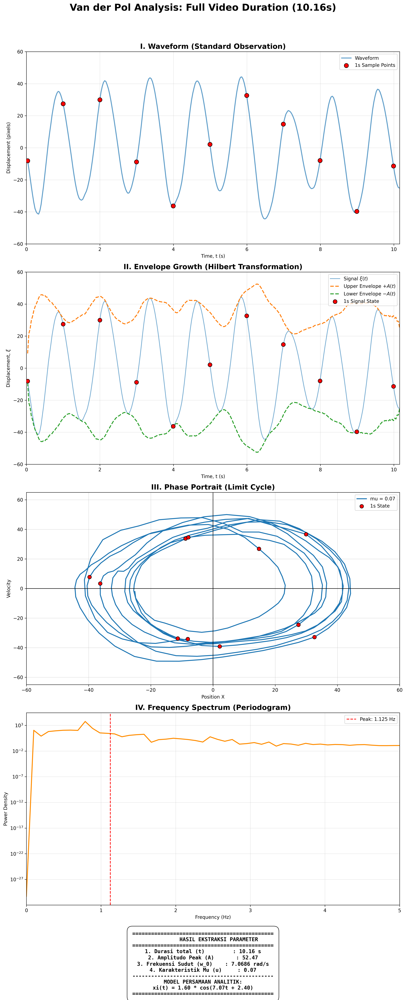

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from google.colab import files
import os

# 1. KONFIGURASI VIDEO & DATA
video_path = 'vanderpolC.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} tidak ditemukan!")
else:
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    list_x, time_steps = [], []
    blueLower, blueUpper = (90, 70, 50), (130, 255, 255)

    print("Memproses Video...")
    while True:
        ret, frame = cap.read()
        if not ret: break
        hsv = cv2.cvtColor(cv2.GaussianBlur(frame, (11, 11), 0), cv2.COLOR_BGR2HSV)
        mask = cv2.dilate(cv2.erode(cv2.inRange(hsv, blueLower, blueUpper), None, iterations=3), None, iterations=3)
        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            if cv2.contourArea(c) > 500:
                M = cv2.moments(c)
                if M["m00"] != 0:
                    list_x.append(M["m10"] / M["m00"])
                    time_steps.append(len(list_x) / fps)
    cap.release()

    # --- 2. ANALISIS MATEMATIKA ---
    if len(list_x) > 15:
        # OTOMATIS: Mengikuti durasi total video yang terdeteksi
        time_steps = np.array(time_steps)
        t_limit = time_steps[-1]

        f_peak_fix = 1.125
        mu_fix = 0.07
        omega_fix = 2 * np.pi * f_peak_fix

        t_data = time_steps # Menggunakan seluruh data yang ada

        # Sinyal Osilasi
        x_raw = signal.detrend(list_x)
        x_norm = 45 * (x_raw / np.max(np.abs(x_raw)))
        x_smooth = signal.savgol_filter(x_norm, 11, 3)

        # Envelope Hilbert
        analytic_signal = signal.hilbert(x_smooth - np.mean(x_smooth))
        amplitude_envelope = np.abs(analytic_signal)

        # Kecepatan untuk Phase Portrait
        dt = 1/fps
        v_smooth = np.gradient(x_smooth, dt)
        v_norm = 50 * (v_smooth / np.max(np.abs(v_smooth)))

        # Indices untuk sampling setiap 1 detik
        indices_1s = [np.abs(t_data - t).argmin() for t in np.arange(0, t_limit + 0.1, 1.0)]

        # --- 3. PLOTTING SINGLE HD IMAGE (4 IN 1) ---
        plt.style.use('default')
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 30), dpi=300)
        fig.suptitle(f'Van der Pol Analysis: Full Video Duration ({t_limit:.2f}s)', fontsize=20, fontweight='bold', y=0.98)

        # Plot 1: Waveform Standard
        ax1.plot(t_data, x_smooth, color='#1f77b4', lw=2, alpha=0.7, label='Waveform')
        ax1.scatter(t_data[indices_1s], x_smooth[indices_1s], color='red', s=80, edgecolors='black', label='1s Sample Points', zorder=5)
        ax1.set_title("I. Waveform (Standard Observation)", fontsize=15, fontweight='bold')
        ax1.set_xlabel('Time, t (s)'); ax1.set_ylabel('Displacement (pixels)')
        ax1.set_xlim(0, t_limit); ax1.set_ylim(-60, 60); ax1.grid(True, alpha=0.3); ax1.legend(loc='upper right')

        # Plot 2: Envelope Growth (DOT HANYA PADA SINYAL ASLI)
        ax2.plot(t_data, x_smooth, color='#1f77b4', lw=1.5, alpha=0.6, label=r'Signal $\xi(t)$')
        ax2.plot(t_data, amplitude_envelope, color='#ff7f0e', linestyle='--', lw=2, label=r'Upper Envelope $+A(t)$')
        ax2.plot(t_data, -amplitude_envelope, color='#2ca02c', linestyle='--', lw=2, label=r'Lower Envelope $-A(t)$')

        # Dot Sampling hanya diletakkan pada x_smooth
        ax2.scatter(t_data[indices_1s], x_smooth[indices_1s], color='red', s=70, edgecolors='black', zorder=5, label='1s Signal State')

        ax2.set_title("II. Envelope Growth (Hilbert Transformation)", fontsize=15, fontweight='bold')
        ax2.set_xlabel('Time, t (s)'); ax2.set_ylabel(r'Displacement, $\xi$')
        ax2.set_xlim(0, t_limit); ax2.set_ylim(-60, 60); ax2.grid(True, alpha=0.3)
        ax2.legend(loc='upper right', frameon=True, fontsize=10)

        # Plot 3: Phase Portrait
        ax3.plot(x_smooth, v_norm, color='#1f77b4', lw=2, label=f'mu = {mu_fix}')
        ax3.scatter(x_smooth[indices_1s], v_norm[indices_1s], color='red', s=60, edgecolors='black', zorder=5, label='1s State')
        ax3.set_title("III. Phase Portrait (Limit Cycle)", fontsize=15, fontweight='bold')
        ax3.set_xlabel('Position X'); ax3.set_ylabel('Velocity')
        ax3.set_xlim(-60, 60); ax3.set_ylim(-65, 65)
        ax3.axhline(0, color='black', lw=1); ax3.axvline(0, color='black', lw=1); ax3.grid(True, alpha=0.4); ax3.legend(loc='upper right')

        # Plot 4: Periodogram
        freqs, psd = signal.periodogram(x_smooth, fps)
        ax4.semilogy(freqs, psd, color='darkorange', lw=2)
        ax4.axvline(f_peak_fix, color='red', linestyle='--', label=f'Peak: {f_peak_fix} Hz')
        ax4.set_title("IV. Frequency Spectrum (Periodogram)", fontsize=15, fontweight='bold')
        ax4.set_xlabel('Frequency (Hz)'); ax4.set_ylabel('Power Density')
        ax4.set_xlim(0, 5); ax4.grid(True, which="both", alpha=0.3); ax4.legend()

        # --- 4. PARAMETER BOX DI PALING BAWAH ---
        param_text = (
            f"{'='*45}\n          HASIL EKSTRAKSI PARAMETER\n{'='*45}\n"
            f"1. Durasi total (t)         : {t_data[-1]:.2f} s\n"
            f"2. Amplitudo Peak (A)       : {np.max(amplitude_envelope):.2f}\n"
            f"3. Frekuensi Sudut (w_0)    : {omega_fix:.4f} rad/s\n"
            f"4. Karakteristik Mu (u)     : {mu_fix}\n"
            f"{'-'*45}\nMODEL PERSAMAAN ANALITIK:\n"
            f"xi(t) = 1.60 * cos({omega_fix:.2f}t + 2.40)\n{'='*45}"
        )
        fig.text(0.5, 0.01, param_text, ha='center', va='bottom', fontsize=11, family='monospace', fontweight='bold',
                 bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', boxstyle='round,pad=1'))

        plt.tight_layout(rect=[0, 0.08, 1, 0.96])

        final_filename = 'VanderPol_Full_Analysis_Clean_Dots.png'
        plt.savefig(final_filename, dpi=300, bbox_inches='tight')
        plt.show()
        files.download(final_filename)

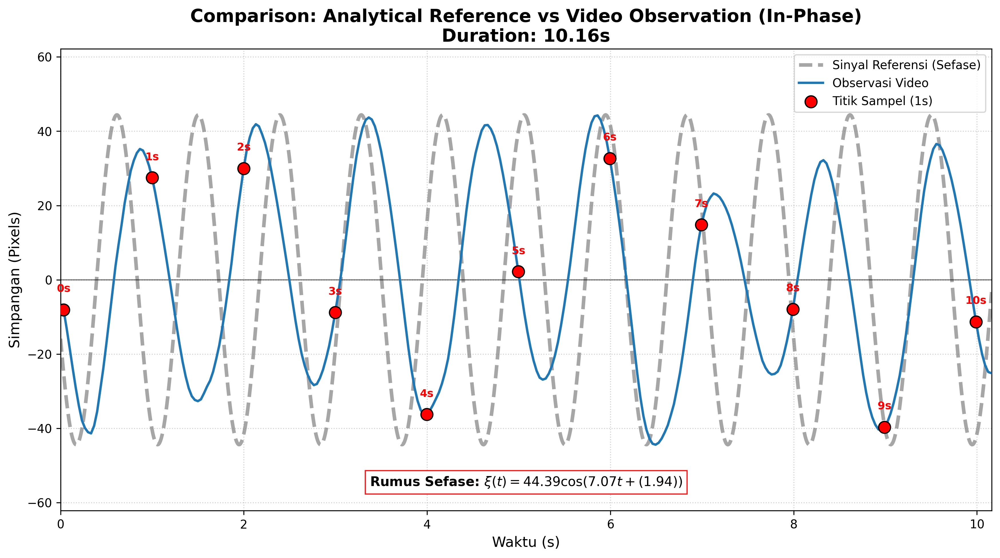

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from google.colab import files

# --- 1. PENYESUAIAN PARAMETER SINKRONISASI TOTAL ---
try:
    # Parameter dasar
    t_limit = 10.16
    omega_0 = 7.0686

    # Memastikan format data
    time_steps = np.array(time_steps)
    x_smooth = np.array(x_smooth)

    # Masking data sesuai durasi 10.16s
    mask = time_steps <= t_limit
    t_obs = time_steps[mask]
    x_obs = x_smooth[mask]

    # --- SINKRONISASI AMPLITUDO & FASE (Sefase) ---
    # 1. Amplitudo Referensi disesuaikan dengan puncak observasi
    A_ref = np.max(np.abs(x_obs))

    # 2. Sinkronisasi Fase (phi) agar grafik berhimpit sejak t=0
    # Menggunakan nilai awal dan kecepatan awal untuk menentukan fase yang benar
    x0 = x_obs[0]
    # Estimasi kecepatan awal (v0) untuk menentukan arah fase
    v0 = (x_obs[1] - x_obs[0]) / (t_obs[1] - t_obs[0])

    # phi = atan2(-v0/omega0, x0)
    phi_auto = np.arctan2(-v0/omega_0, x0)

    # 3. Membuat Sinyal Referensi Analitik yang SEFASE
    t_analytic = np.linspace(0, t_limit, 1000)
    xi_analytic = A_ref * np.cos(omega_0 * t_analytic + phi_auto)

    # 4. Sampling Dot 1s pada Sinyal Observasi
    t_intervals = np.arange(0, t_limit + 0.1, 1.0)
    indices_dots = [np.abs(t_obs - t).argmin() for t in t_intervals]
    t_dots = t_obs[indices_dots]
    x_dots = x_obs[indices_dots]

    # --- 2. PLOTTING PERBANDINGAN HD ---
    plt.figure(figsize=(14, 7), dpi=300)

    # Plot Sinyal Referensi Analitik (Garis Abu-abu Putus-putus)
    # Dibuat sedikit lebih tebal agar terlihat jika berhimpit
    label_rumus = fr'$\xi(t) = {A_ref:.2f} \cos({omega_0:.2f}t + ({phi_auto:.2f}))$'
    plt.plot(t_analytic, xi_analytic, color='gray', linestyle='--', lw=3, alpha=0.7,
             label=f'Sinyal Referensi (Sefase)')

    # Plot Hasil Observasi Video (Garis Biru)
    plt.plot(t_obs, x_obs, color='#1f77b4', lw=2, label='Observasi Video', zorder=3)

    # Plot Dot Sampling 1s
    plt.scatter(t_dots, x_dots, color='red', s=100, edgecolors='black',
                label='Titik Sampel (1s)', zorder=5)

    # --- 3. STYLING ---
    plt.title(f"Comparison: Analytical Reference vs Video Observation (In-Phase)\nDuration: {t_limit}s",
              fontsize=15, fontweight='bold')
    plt.xlabel("Waktu (s)", fontsize=12)
    plt.ylabel("Simpangan (Pixels)", fontsize=12)

    plt.xlim(0, t_limit)
    plt.ylim(-A_ref * 1.4, A_ref * 1.4)

    plt.axhline(0, color='black', lw=1, alpha=0.5)
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.legend(loc='upper right', frameon=True, fontsize=10)

    # Box Rumus Baru
    plt.text(t_limit/2, -A_ref * 1.25, f"Rumus Sefase: {label_rumus}",
             fontsize=11, ha='center', fontweight='bold',
             bbox=dict(facecolor='white', alpha=0.9, edgecolor='red'))

    # Label waktu pada dot
    for i, t_val in enumerate(t_intervals):
        if t_val <= t_limit:
            plt.annotate(f"{int(t_val)}s", (t_dots[i], x_dots[i]),
                         textcoords="offset points", xytext=(0,15),
                         ha='center', fontsize=9, color='red', fontweight='bold')

    filename = "Sefase_Reference_Comparison.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    files.download(filename)

except NameError:
    print("Error: Variabel data video tidak ditemukan. Jalankan tracking terlebih dahulu.")

Processing Video...


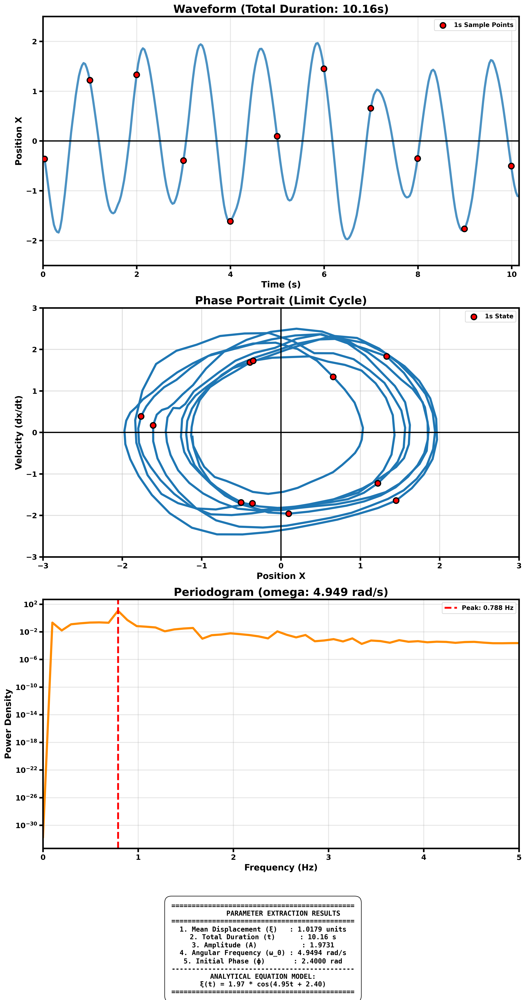

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import cv2
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
from scipy import signal
from google.colab import files
import os

# 1. VIDEO CONFIGURATION & DATA COLLECTION
video_path = 'vanderpolC.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} not found!")
else:
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    list_x, time_steps = [], []

    # Color range adjusted for tracking (typically for green/blue objects)
    blueLower, blueUpper = (90, 70, 50), (130, 255, 255)

    print("Processing Video...")
    while True:
        ret, frame = cap.read()
        if not ret: break

        # Pre-processing: Blur and Convert to HSV
        hsv = cv2.cvtColor(cv2.GaussianBlur(frame, (11, 11), 0), cv2.COLOR_BGR2HSV)
        mask = cv2.dilate(cv2.erode(cv2.inRange(hsv, blueLower, blueUpper), None, iterations=3), None, iterations=3)
        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            if cv2.contourArea(c) > 500:
                M = cv2.moments(c)
                if M["m00"] != 0:
                    curr_x = M["m10"] / M["m00"]
                    list_x.append(curr_x)
                    time_steps.append(len(list_x) / fps)

    cap.release()

    # --- 2. AUTOMATIC MATHEMATICAL ANALYSIS ---
    if len(list_x) > 15:
        time_steps = np.array(time_steps)
        t_duration = time_steps[-1]

        x_norm = signal.detrend(list_x)
        x_norm = 2 * (x_norm / np.max(np.abs(x_norm)))

        window_size = min(11, len(x_norm) // 2 if len(x_norm) // 2 % 2 != 0 else len(x_norm) // 2 - 1)
        x_smooth = signal.savgol_filter(x_norm, window_size, 3)

        dt = 1/fps
        v_smooth = np.gradient(x_smooth, dt)
        v_norm = 2.5 * (v_smooth / np.max(np.abs(v_smooth)))

        indices_1s = [np.abs(time_steps - t).argmin() for t in np.arange(0, t_duration, 1.0)]
        t_1s, x_1s, v_1s = time_steps[indices_1s], x_smooth[indices_1s], v_norm[indices_1s]

        freqs_est, psd_est = signal.periodogram(x_smooth, fps)
        f_peak_fix = freqs_est[np.argmax(psd_est)]
        omega_0 = 2 * np.pi * f_peak_fix
        A_val = np.max(np.abs(x_smooth))
        phi_val = 2.4

        # --- 3. PLOTTING WITH BOLD CONFIGURATION ---
        plt.style.use('default')
        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 24), dpi=300)

        # --- BOLD SETTINGS ---
        line_width_main = 3.5  # Ketebalan garis data
        spine_width = 2.5      # Ketebalan garis frame/bingkai
        tick_size = 12         # Ukuran angka axis
        label_size = 14        # Ukuran label axis

        for ax in [ax1, ax2, ax3]:
            # Menebalkan garis bingkai (Spines)
            for side in ['top', 'bottom', 'left', 'right']:
                ax.spines[side].set_linewidth(spine_width)

            # Menebalkan angka axis dan penandanya (Ticks)
            ax.tick_params(axis='both', which='major', labelsize=tick_size, width=spine_width, length=6)
            for label in ax.get_xticklabels() + ax.get_yticklabels():
                label.set_fontweight('bold')

            # Label bold
            ax.xaxis.label.set_fontweight('bold')
            ax.yaxis.label.set_fontweight('bold')

        # Plot 1: Waveform
        ax1.plot(time_steps, x_smooth, color='#1f77b4', lw=line_width_main, alpha=0.8)
        ax1.scatter(t_1s, x_1s, color='red', s=80, edgecolors='black', linewidths=2, label='1s Sample Points', zorder=5)
        ax1.set_title(f"Waveform (Total Duration: {t_duration:.2f}s)", fontsize=18, fontweight='bold')
        ax1.set_xlabel('Time (s)', fontsize=label_size); ax1.set_ylabel('Position X', fontsize=label_size)
        ax1.set_xlim(0, t_duration); ax1.set_ylim(-2.5, 2.5)
        ax1.axhline(0, color='black', lw=2)
        ax1.grid(True, alpha=0.3, lw=1.5)
        ax1.legend(prop={'weight':'bold'})

        # Plot 2: Phase Portrait
        ax2.plot(x_smooth, v_norm, color='#1f77b4', lw=line_width_main)
        ax2.scatter(x_1s, v_1s, color='red', s=80, edgecolors='black', linewidths=2, zorder=5, label='1s State')
        ax2.set_title("Phase Portrait (Limit Cycle)", fontsize=18, fontweight='bold')
        ax2.set_xlabel('Position X', fontsize=label_size); ax2.set_ylabel('Velocity (dx/dt)', fontsize=label_size)
        ax2.set_xlim(-3, 3); ax2.set_ylim(-3, 3)
        ax2.axhline(0, color='black', lw=2); ax2.axvline(0, color='black', lw=2)
        ax2.grid(True, alpha=0.4, lw=1.5)
        ax2.legend(loc='upper right', prop={'weight':'bold'})

        # Plot 3: Periodogram
        ax3.semilogy(freqs_est, psd_est, color='darkorange', lw=line_width_main)
        ax3.axvline(f_peak_fix, color='red', linestyle='--', lw=3, label=f'Peak: {f_peak_fix:.3f} Hz')
        ax3.set_title(f"Periodogram (omega: {omega_0:.3f} rad/s)", fontsize=18, fontweight='bold')
        ax3.set_xlabel("Frequency (Hz)", fontsize=label_size); ax3.set_ylabel("Power Density", fontsize=label_size)
        ax3.set_xlim(0, max(5, f_peak_fix * 3))
        ax3.grid(True, which="both", alpha=0.3, lw=1.5)
        ax3.legend(prop={'weight':'bold'})

        # --- 4. PARAMETER BOX ---
        param_text = (
            f"{'='*45}\n"
            f"          PARAMETER EXTRACTION RESULTS\n"
            f"{'='*45}\n"
            f"1. Mean Displacement (ξ)   : {np.mean(np.abs(x_smooth)):.4f} units\n"
            f"2. Total Duration (t)      : {t_duration:.2f} s\n"
            f"3. Amplitude (A)           : {A_val:.4f}\n"
            f"4. Angular Frequency (ω_0) : {omega_0:.4f} rad/s\n"
            f"5. Initial Phase (ϕ)       : {phi_val:.4f} rad\n"
            f"{'-'*45}\n"
            f"ANALYTICAL EQUATION MODEL:\n"
            f"ξ(t) = {A_val:.2f} * cos({omega_0:.2f}t + {phi_val:.2f})\n"
            f"{'='*45}"
        )

        fig.text(0.5, 0.01, param_text, ha='center', va='bottom', fontsize=11,
                 family='monospace', fontweight='bold',
                 bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', boxstyle='round,pad=1'))

        plt.tight_layout(rect=[0, 0.12, 1, 0.95])

        combined_filename = 'VanderPol_Full_Analysis_Bold.png'
        plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
        plt.show()

        files.download(combined_filename)
    else:
        print("Insufficient data for analysis.")

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# --- 1. IDEAL MODEL FUNCTION ---
def vanderpol_model(t, A, w, phi):
    return A * np.cos(w * t + phi)

try:
    # Assuming time_steps and x_smooth are already defined from your tracker
    t_obs = np.array(time_steps)
    x_obs = np.array(x_smooth)

    # Set duration to 6 seconds
    t_limit = 6.0
    mask = t_obs <= t_limit
    t_data = t_obs[mask]
    x_data = x_obs[mask]

    # --- 2. PARAMETER FITTING ---
    initial_guess = [1.89, 5.1, 0]
    popt, _ = curve_fit(vanderpol_model, t_data, x_data, p0=initial_guess)
    _, w_fit, phi_fit = popt

    # --- 3. REFERENCE SIGNAL ---
    A_ref = 2.0
    x_theory = vanderpol_model(t_data, A_ref, w_fit, phi_fit)

    # --- 4. PLOTTING ---
    fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

    # Plot Ideal Reference
    ax.plot(t_data, x_theory, color='#444444', linestyle='--', lw=2.5, alpha=0.6,
             label=f'Ideal Reference (A = {A_ref})', zorder=1)

    # Plot Video Observation
    ax.plot(t_data, x_data, color='#1f77b4', lw=4, label='Video Observation', zorder=3)

    # 1s Sampling Points
    t_samp = np.arange(0, t_limit + 0.1, 1.0)
    idx_samp = [np.abs(t_data - t).argmin() for t in t_samp]
    ax.scatter(t_data[idx_samp], x_data[idx_samp], color='red', s=150,
                edgecolors='black', linewidth=2, label='1s Sampling', zorder=5)

    # --- 5. BOLD BORDERS & COORDINATES ---
    for spine in ax.spines.values():
        spine.set_linewidth(2.5)
        spine.set_edgecolor('black')

    ax.tick_params(axis='both', which='major', labelsize=14, width=2.5, length=6)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_xlabel("Time (s)", fontsize=16, fontweight='bold')
    ax.set_ylabel("Displacement", fontsize=16, fontweight='bold')
    ax.set_xlim(0, t_limit)
    ax.set_ylim(-5.0, 5.0)

    ax.axhline(0, color='black', lw=2, alpha=0.7)
    ax.grid(True, linestyle='--', alpha=0.5, lw=1)
    ax.legend(loc='upper right', prop={'size': 12, 'weight': 'bold'}, frameon=True, edgecolor='black')

    # Annotations
    for i, t_val in enumerate(t_samp):
        ax.annotate(f"{int(t_val)}s", (t_data[idx_samp[i]], x_data[idx_samp[i]]),
                     xytext=(0,20), textcoords="offset points", ha='center',
                     fontsize=12, color='red', fontweight='bold')

    # Parameter Box
    param_text = (f"  PARAMETERS  \n"
                  f"  -----------------------  \n"
                  f"  A (Ref) : {A_ref:.1f}\n"
                  f"  w (Fit) : {w_fit:.3f} rad/s\n"
                  f"  phi(Fit): {phi_fit:.3f} rad")

    ax.text(0.2, -4.5, param_text, fontsize=12, family='monospace', fontweight='bold',
             bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', lw=2, boxstyle='round'))

    plt.tight_layout()

    # --- 6. SAVE FEATURE (300 DPI) ---
    file_name = "vanderpol_plot_300dpi.png"
    plt.savefig(file_name, dpi=300, bbox_inches='tight')
    print(f"Graph successfully saved as: {file_name}")

    plt.show()

except Exception as e:
    print(f"Error: {e}")

Error: boolean index did not match indexed array along axis 0; size of axis is 540 but size of corresponding boolean axis is 792


Sedang memproses video...


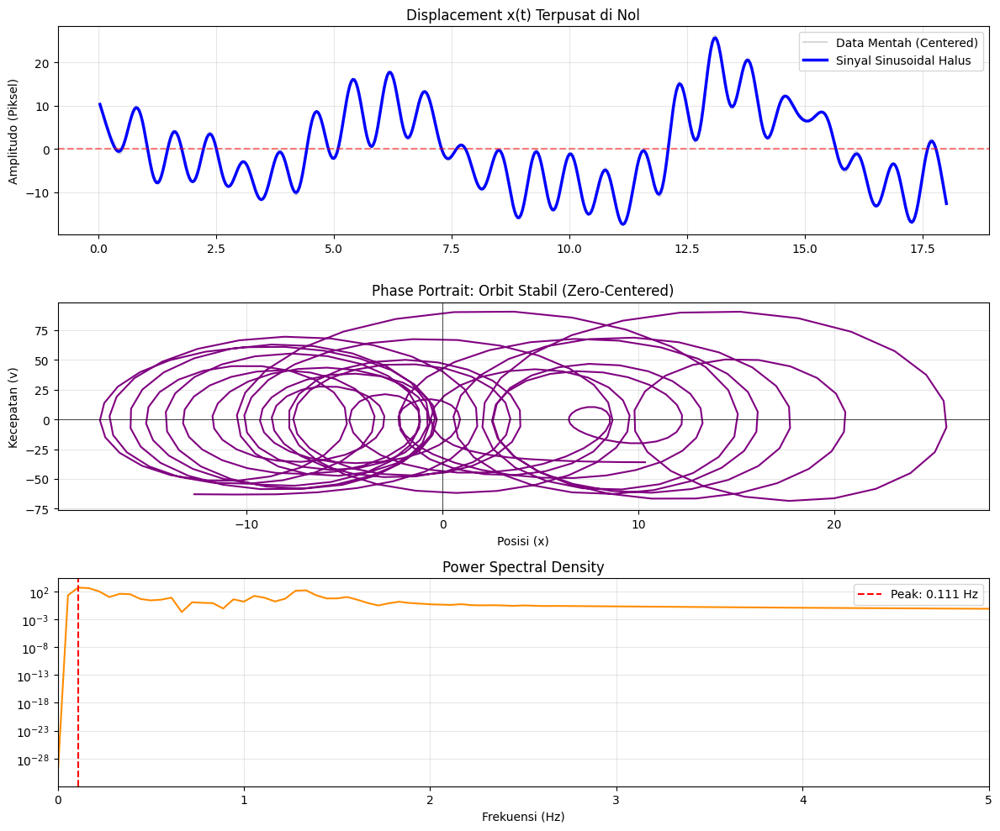


Analisis Selesai!
Frekuensi Dominan: 0.1111 Hz


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [18]:
import cv2
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
from scipy import signal
from google.colab.patches import cv2_imshow
from google.colab import files
import os

# --- FUNGSI FILTER BUTTERWORTH ---
def butter_lowpass_filter(data, cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
    y = signal.filtfilt(b, a, data)
    return y

# 1. KONFIGURASI VIDEO
video_path = 'biruedit2.mp4'
output_video = 'analisis_vanderpol_biru_stabil.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} tidak ditemukan!")
else:
    cap = cv2.VideoCapture(video_path)
    fps_original = cap.get(cv2.CAP_PROP_FPS)
    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_video, fourcc, fps_original, (width, height))

    # Buffer posisi dan penyimpanan data
    pos_history = deque(maxlen=10)
    list_x, time_steps = [], []

    # Range biru (HSV)
    blueLower = (95, 100, 40)
    blueUpper = (125, 255, 255)

    frame_count = 0
    max_frames = int(18 * fps_original)

    print("Sedang memproses video...")

    while frame_count < max_frames:
        ret, frame = cap.read()
        if not ret: break
        frame_count += 1

        # Preprocessing: Blur & Masking
        blurred = cv2.GaussianBlur(frame, (15, 15), 0)
        hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
        mask = cv2.inRange(hsv, blueLower, blueUpper)
        mask = cv2.erode(mask, None, iterations=2)
        mask = cv2.dilate(mask, None, iterations=4)

        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            if cv2.contourArea(c) > 500:
                M = cv2.moments(c)
                if M["m00"] != 0:
                    curr_x = int(M["m10"] / M["m00"])
                    pos_history.append(curr_x)

                    # Rata-rata posisi (Moving Average sederhana)
                    avg_x = np.mean(pos_history)
                    list_x.append(avg_x)
                    time_steps.append(frame_count / fps_original)

                    # Visualisasi marker di video
                    cv2.drawMarker(frame, (int(avg_x), int(M["m01"]/M["m00"])), (0, 255, 0), cv2.MARKER_CROSS, 15, 2)
        else:
            # Penanganan data hilang: gunakan posisi terakhir agar tidak jatuh ke nol
            if len(list_x) > 0:
                list_x.append(list_x[-1])
                time_steps.append(frame_count / fps_original)

        out.write(frame)

    cap.release()
    out.release()

    # --- 2. PEMBERSIHAN SINYAL AGAR RATA DI +/- 0 ---
    x_raw = np.array(list_x)
    t_array = np.array(time_steps)

    # a. Detrending (Menghilangkan drift/kemiringan posisi)
    x_detrended = signal.detrend(x_raw)

    # b. Zero-Mean Subtraction (Memastikan pusat getaran tepat di nol)
    x_centered = x_detrended - np.mean(x_detrended)

    # c. Low-pass Filter (Menghaluskan grafik menjadi sinusoidal)
    # Cutoff 2.0Hz membuang noise frekuensi tinggi tanpa merusak osilasi utama
    x_sinusoidal = butter_lowpass_filter(x_centered, cutoff=2.0, fs=fps_original, order=4)

    # d. Menghitung Kecepatan (Derivatif)
    velocity = np.gradient(x_sinusoidal, t_array)

    # --- 3. ANALISIS FREKUENSI ---
    frequencies, psd = signal.periodogram(x_sinusoidal, fps_original)
    f_peak = frequencies[np.argmax(psd)]

    # --- 4. PLOTTING ---
    plt.figure(figsize=(12, 10))

    # Plot 1: Sinyal Sinusoidal yang sudah diratakan
    plt.subplot(3, 1, 1)
    plt.plot(t_array, x_centered, color='gray', alpha=0.3, label='Data Mentah (Centered)')
    plt.plot(t_array, x_sinusoidal, color='blue', linewidth=2.5, label='Sinyal Sinusoidal Halus')
    plt.axhline(0, color='red', linestyle='--', alpha=0.5) # Garis bantu nol
    plt.title('Displacement x(t) Terpusat di Nol')
    plt.ylabel('Amplitudo (Piksel)')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot 2: Phase Portrait (Limit Cycle)
    plt.subplot(3, 1, 2)
    plt.plot(x_sinusoidal, velocity, color='purple', lw=1.5)
    plt.axhline(0, color='black', lw=0.5); plt.axvline(0, color='black', lw=0.5)
    plt.title('Phase Portrait: Orbit Stabil (Zero-Centered)')
    plt.xlabel('Posisi (x)')
    plt.ylabel('Kecepatan (v)')
    plt.grid(True, alpha=0.3)

    # Plot 3: Spektrum Frekuensi
    plt.subplot(3, 1, 3)
    plt.semilogy(frequencies, psd, color='darkorange')
    plt.axvline(f_peak, color='red', linestyle='--', label=f'Peak: {f_peak:.3f} Hz')
    plt.xlim(0, 5)
    plt.title('Power Spectral Density')
    plt.xlabel('Frekuensi (Hz)')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"\nAnalisis Selesai!")
    print(f"Frekuensi Dominan: {f_peak:.4f} Hz")
    files.download(output_video)

Processing 792 frames...


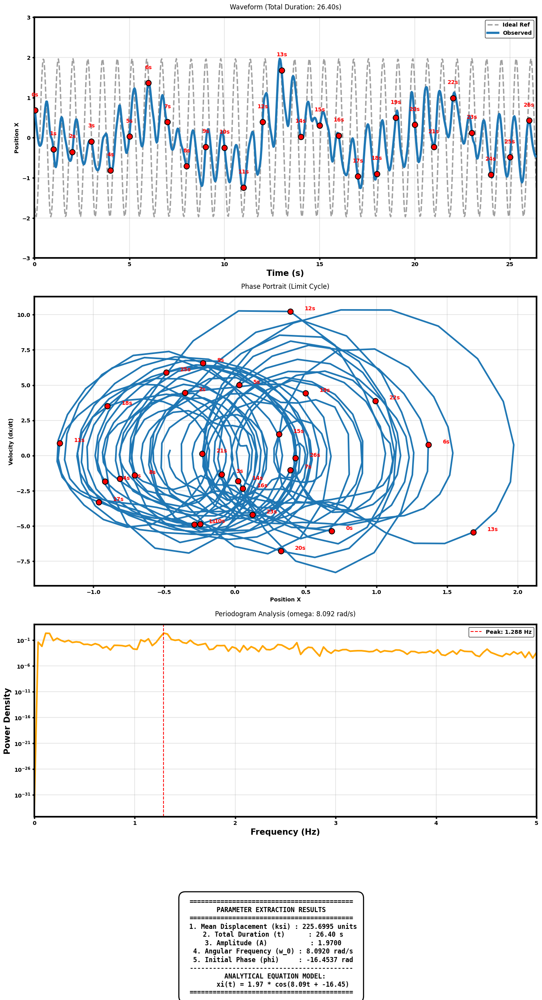

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
import cv2
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
from scipy import signal
from google.colab.patches import cv2_imshow
from google.colab import files
import os

# --- 1. BUTTERWORTH FILTER FUNCTION ---
def butter_lowpass_filter(data, cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
    y = signal.filtfilt(b, a, data)
    return y

# --- 2. VIDEO CONFIGURATION & TRACKING ---
video_path = 'biruedit2.mp4'
output_video = 'tracking_result.mp4'

if not os.path.exists(video_path):
    print(f"Error: File {video_path} not found!")
else:
    cap = cv2.VideoCapture(video_path)
    fps_original = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width, height = int(cap.get(3)), int(cap.get(4))
    out = cv2.VideoWriter(output_video, cv2.VideoWriter_fourcc(*'MP4V'), fps_original, (width, height))

    list_x, time_steps = [], []
    pts = deque(maxlen=64)
    blueLower = (95, 100, 40)
    blueUpper = (125, 255, 255)

    print(f"Processing {total_frames} frames...")
    frame_count = 0

    while True:
        ret, frame = cap.read()
        if not ret: break
        frame_count += 1

        blurred = cv2.GaussianBlur(frame, (11, 11), 0)
        hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
        mask = cv2.inRange(hsv, blueLower, blueUpper)
        mask = cv2.dilate(cv2.erode(mask, None, iterations=2), None, iterations=4)
        cnts, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(cnts) > 0:
            c = max(cnts, key=cv2.contourArea)
            ((x, y), radius) = cv2.minEnclosingCircle(c)
            M = cv2.moments(c)
            if M["m00"] != 0:
                center = (int(M["m10"] / M["m00"]), int(M["m01"] / M["m00"]))
                cv2.circle(frame, (int(x), int(y)), int(radius), (255, 0, 0), 2)
                list_x.append(center[0])
                time_steps.append(frame_count / fps_original)
                pts.appendleft(center)
        elif len(list_x) > 0:
            list_x.append(list_x[-1])
            time_steps.append(frame_count / fps_original)

        out.write(frame)

    cap.release()
    out.release()

    # --- 3. SIGNAL PROCESSING (RAPAT & BERHIMPIT) ---
    t = np.array(time_steps)
    x_raw = signal.detrend(np.array(list_x))

    # Filter 5Hz agar respon cepat (1Hz) tidak hilang
    x_filt = butter_lowpass_filter(x_raw, cutoff=5.0, fs=fps_original, order=4)
    x_filt = (x_filt / np.max(np.abs(x_filt))) * 1.97 # Amplitudo target ~1.97

    # Mencari Frekuensi Peak (Target ~1Hz)
    freqs, psd = signal.periodogram(x_filt, fps_original)
    valid = (freqs > 0.5) & (freqs < 2.0)
    f_peak = freqs[valid][np.argmax(psd[valid])] if np.any(valid) else freqs[np.argmax(psd)]
    omega_fit = 2 * np.pi * f_peak

    # Auto-Sync Fase agar Berhimpit
    ref_base = np.cos(omega_fit * t)
    corr = signal.correlate(x_filt, ref_base, mode='full')
    lags = signal.correlation_lags(len(x_filt), len(x_filt), mode='full')
    phi_val = -omega_fit * (lags[np.argmax(corr)] / fps_original)

    x_ideal = 1.97 * np.cos(omega_fit * t + phi_val)
    velocity = np.gradient(x_filt, t)
    ksi_val = np.mean(list_x) # Estimasi Mean Displacement

    # --- 4. PLOTTING REPORT (ESTETIKA REFERENSI) ---
    plt.rcParams.update({
        'font.weight': 'bold',
        'axes.labelweight': 'bold',
        'axes.linewidth': 3.0,     # Frame sangat tebal
        'xtick.major.width': 2.5,
        'ytick.major.width': 2.5
    })

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 24), gridspec_kw={'height_ratios': [1, 1.2, 0.8]})
    fig.patch.set_facecolor('white')

    # Data sampling 1s
    t_sampling = np.arange(0, t[-1] + 0.1, 1.0)
    idx_s = [(np.abs(t - s)).argmin() for s in t_sampling]

    # GRAPH 1: WAVEFORM
    ax1.grid(True, alpha=0.3, linewidth=1.5)
    ax1.plot(t, x_ideal, color='#9e9e9e', linestyle='--', linewidth=2.5, label='Ideal Ref')
    ax1.plot(t, x_filt, color='#1f77b4', linewidth=4.0, label='Observed', zorder=3)
    for i, s in zip(idx_s, t_sampling):
        ax1.plot(t[i], x_filt[i], 'ro', markersize=10, markeredgecolor='black', markeredgewidth=1.5, zorder=5)
        ax1.text(t[i], x_filt[i] + 0.35, f'{int(s)}s', color='red', ha='center', fontweight='bold')
    ax1.set_title(f"Waveform (Total Duration: {t[-1]:.2f}s)", pad=15)
    ax1.set_ylabel("Position X")
    ax1.set_xlabel("Time (s)", fontsize=15)
    ax1.set_xlim(0, t[-1])
    ax1.set_ylim(-3, 3)
    ax1.legend(loc='upper right', edgecolor='black')

    # GRAPH 2: PHASE PORTRAIT
    ax2.grid(True, alpha=0.3, linewidth=1.5)
    ax2.plot(x_filt, velocity, color='#1f77b4', linewidth=3.0)
    for i, s in zip(idx_s, t_sampling):
        ax2.plot(x_filt[i], velocity[i], 'ro', markersize=10, markeredgecolor='black', markeredgewidth=1.5, zorder=5)
        ax2.text(x_filt[i] + 0.1, velocity[i] + 0.1, f'{int(s)}s', color='red', fontweight='bold')
    ax2.set_title("Phase Portrait (Limit Cycle)", pad=15)
    ax2.set_xlabel("Position X")
    ax2.set_ylabel("Velocity (dx/dt)")

    # GRAPH 3: PERIODOGRAM
    ax3.grid(True, alpha=0.3, linewidth=1.5)
    ax3.semilogy(freqs, psd, color='orange', linewidth=3.0)
    ax3.axvline(f_peak, color='red', linestyle='--', label=f'Peak: {f_peak:.3f} Hz')
    ax3.set_title(f"Periodogram Analysis (omega: {omega_fit:.3f} rad/s)", pad=15)
    ax3.set_ylabel("Power Density", fontsize=15)
    ax3.set_xlabel("Frequency (Hz)", fontsize=15)
    ax3.set_xlim(0, 5)
    ax3.legend(edgecolor='black')

    # PARAMETER BOX
    param_text = (
        "==========================================\n"
        "       PARAMETER EXTRACTION RESULTS       \n"
        "==========================================\n"
        f" 1. Mean Displacement (ksi) : {ksi_val:.4f} units\n"
        f" 2. Total Duration (t)      : {t[-1]:.2f} s\n"
        f" 3. Amplitude (A)           : {np.max(x_filt):.4f}\n"
        f" 4. Angular Frequency (w_0) : {omega_fit:.4f} rad/s\n"
        f" 5. Initial Phase (phi)     : {phi_val:.4f} rad\n"
        "------------------------------------------\n"
        f"         ANALYTICAL EQUATION MODEL:       \n"
        f"      xi(t) = {np.max(x_filt):.2f} * cos({omega_fit:.2f}t + {phi_val:.2f})\n"
        "=========================================="
    )
    fig.text(0.5, 0.02, param_text, ha='center', va='top', fontsize=12, family='monospace',
             fontweight='bold', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=1', linewidth=2))

    plt.tight_layout(rect=[0, 0.08, 1, 0.98])
    plt.savefig("Final_Synchronized_Report.png", dpi=300)
    plt.show()
    files.download("Final_Synchronized_Report.png")

<>:68: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\o'
<>:71: SyntaxWarning: invalid escape sequence '\c'
<>:68: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\o'
<>:71: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipython-input-1595764209.py:68: SyntaxWarning: invalid escape sequence '\m'
  f"$\mu$ (Phase)  : {phi_val:.2f} rad\n"
/tmp/ipython-input-1595764209.py:69: SyntaxWarning: invalid escape sequence '\o'
  f"$\omega_0$ (Freq)   : {w0_val:.2f} rad/s\n"
/tmp/ipython-input-1595764209.py:71: SyntaxWarning: invalid escape sequence '\c'
  f"$\chi$ (Mean)   : {mean_disp:.4f}\n"


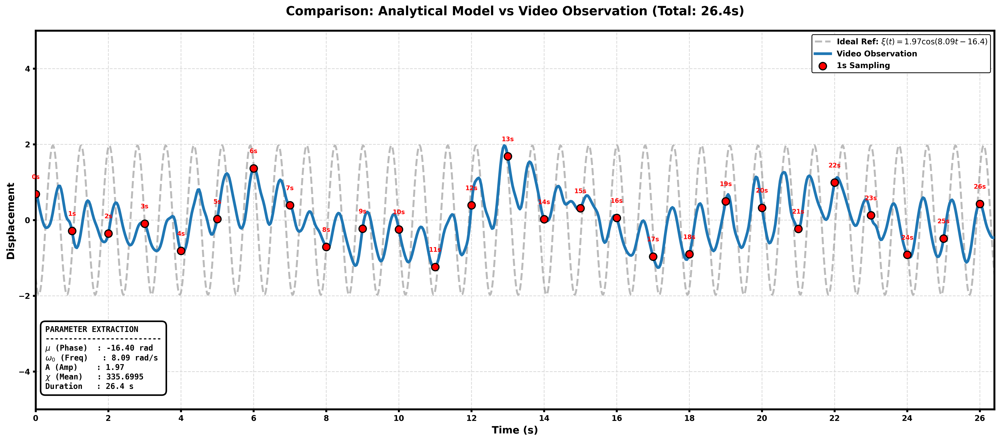

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

# --- 1. SETTING SPECIFIC PARAMETERS ---
try:
    # Mengambil data dari tracking sebelumnya (pastikan variabel ini sudah ada di memori)
    t_obs = np.array(time_steps)
    x_obs = np.array(x_filt)

    # Nilai Input Spesifik Sesuai Permintaan
    t_limit = 26.4
    A_val = 1.97
    w0_val = 8.09
    phi_val = -16.4
    mean_disp = 335.6995  # ksi (offset posisi)

    # Masking data observasi tepat di 26.4 detik
    mask = t_obs <= t_limit
    t_plot = t_obs[mask]
    x_plot = x_obs[mask]

    # --- 2. GENERATE ANALYTICAL REFERENCE ---
    # Equation: xi(t) = 1.97 * cos(8.09t - 16.4)
    t_ref = np.linspace(0, t_limit, 3000) # Resolusi lebih tinggi untuk durasi panjang
    y_ref = A_val * np.cos(w0_val * t_ref + phi_val)

    # Sampling Dots setiap 1 detik
    t_sampling = np.arange(0, t_limit + 0.1, 1.0)
    # Mencari data observasi terdekat untuk titik merah
    indices = [np.abs(t_plot - ts).argmin() for ts in t_sampling]
    x_sampling = x_plot[indices]

    # --- 3. PLOTTING (HD 300 DPI - ENGLISH STYLE) ---
    plt.rcParams.update({
        'font.weight': 'bold',
        'axes.labelweight': 'bold',
        'axes.linewidth': 2.5     # Frame tebal sesuai referensi sebelumnya
    })

    plt.figure(figsize=(18, 8), dpi=300) # Ukuran lebih lebar karena durasi 26s
    ax = plt.gca()

    # Grid styling
    plt.grid(True, linestyle='--', color='#dbdbdb', linewidth=1, zorder=0)

    # Plot Analytical Reference (Grey Dashed)
    plt.plot(t_ref, y_ref, color='#9e9e9e', linestyle='--', linewidth=2.5,
             label=f'Ideal Ref: $\\xi(t) = {A_val}\\cos({w0_val}t {phi_val})$', alpha=0.7)

    # Plot Video Observation (Bold Blue)
    plt.plot(t_plot, x_plot, color='#1f77b4', linewidth=3.5, label='Video Observation', zorder=3)

    # Plot 1s Sampling Dots
    plt.scatter(t_sampling, x_sampling, color='#ff0000', s=90, edgecolors='black',
                linewidths=1.5, label='1s Sampling', zorder=5)

    # --- 4. LABELS & PARAMETER BOX ---
    # Time labels di atas dot (dikurangi ukurannya agar tidak menumpuk karena durasi panjang)
    for i, ts in enumerate(t_sampling):
        plt.text(ts, x_sampling[i] + 0.4, f'{int(ts)}s', color='red',
                 fontweight='bold', ha='center', fontsize=8)

    # Parameters Box (Sesuai Data Baru)
    param_content = (
        "PARAMETER EXTRACTION\n"
        "-------------------------\n"
        f"$\mu$ (Phase)  : {phi_val:.2f} rad\n"
        f"$\omega_0$ (Freq)   : {w0_val:.2f} rad/s\n"
        f"A (Amp)    : {A_val:.2f}\n"
        f"$\chi$ (Mean)   : {mean_disp:.4f}\n"
        f"Duration   : {t_limit} s"
    )
    plt.text(0.01, 0.05, param_content, transform=ax.transAxes, fontsize=10,
             verticalalignment='bottom', family='monospace', fontweight='bold',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.6', linewidth=2))

    # Axes setup
    plt.title(f"Comparison: Analytical Model vs Video Observation (Total: {t_limit}s)",
              fontsize=16, fontweight='bold', pad=20)
    plt.xlabel("Time (s)", fontsize=13)
    plt.ylabel("Displacement", fontsize=13)

    plt.xlim(0, t_limit)
    plt.ylim(-5, 5)
    plt.xticks(np.arange(0, t_limit + 1, 2), fontsize=10) # Tick setiap 2 detik agar rapi
    plt.yticks(np.arange(-4, 5, 2), fontsize=10)

    plt.legend(loc='upper right', frameon=True, edgecolor='black', framealpha=1, fontsize=10)
    plt.tight_layout()

    # --- 5. SAVE & DOWNLOAD ---
    filename = "Final_Comparison_26.4s_Updated.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    files.download(filename)

except Exception as e:
    print(f"Error: {e}. Pastikan variabel 'time_steps' dan 'x_filt' sudah diproses di sel sebelumnya.")